**<h1> Manipulating Images </h1>**


Estimated time needed: **30** minutes


<h2>Objectives</h2>


In this lab, you will learn how to manipulate images, OpenCV image Arrays. You will learn how to copy an image to avoid aliasing. We will cover flipping images and cropping images. You will also learn to change pixel images; this will allow you to draw shapes, write text and superimpose images over other images.


<ul>
    <li><a href='#MI'>Manipulating Images </a>
        <ul>
            <li>Copying Images  </li>
            <li>Fliping Images </li>
            <li>Cropping an Image </li>
            <li>Changing Specific Image Pixels </li>
     
  
    
</ul>


----


Download the images for the lab


In [3]:
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/cat.png -O cat.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/lenna.png -O lenna.png
!wget https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-CV0101EN-SkillsNetwork/images%20/images_part_1/baboon.png -O baboon.png

'wget' is not recognized as an internal or external command,
operable program or batch file.
'wget' is not recognized as an internal or external command,
operable program or batch file.


'wget' is not recognized as an internal or external command,
operable program or batch file.


We will be using these imported functions in the lab


In [4]:
import matplotlib.pyplot as plt
import cv2
import numpy as np

## Copying Images


If you want to reassign an array to another variable, you should use the `copy` method. If we do not apply the method `copy()`, the variable will point to the same location in memory. Consider the following array:


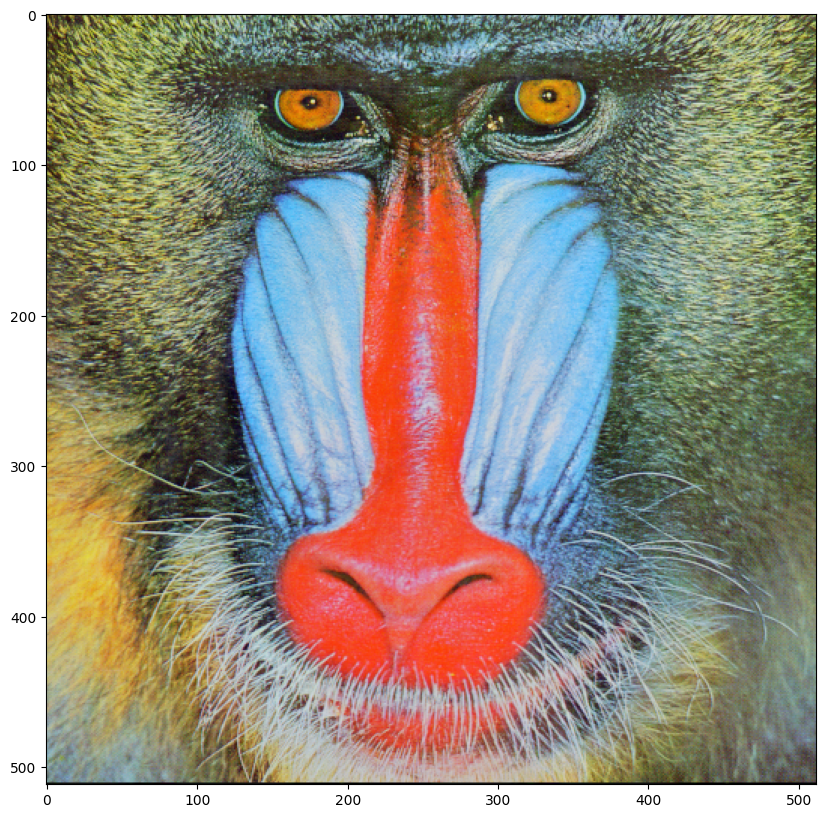

In [ ]:
import cv2  # Giả sử bạn đã import cv2 ở đầu chương trình

baboon = cv2.imread("baboon.png")                 # Đọc tệp hình ảnh 'baboon.png' bằng OpenCV. OpenCV đọc ảnh theo thứ tự kênh màu BGR (Blue, Green, Red) mặc định.

plt.figure(figsize=(10,10))                       # Tạo một vùng vẽ (figure) trong Matplotlib có kích thước 10x10 inch.

plt.imshow(cv2.cvtColor(baboon, cv2.COLOR_BGR2RGB)) # CHUYỂN ĐỔI: Chuyển đổi thứ tự kênh màu của ảnh từ BGR (cách OpenCV lưu) sang RGB (cách Matplotlib hiển thị) trước khi vẽ. Hiển thị ảnh đã chuyển đổi.

plt.show()                                        # Hiển thị cửa sổ hình ảnh ra màn hình.


If we do not apply the method `copy()`, the new variable will point to the same location in memory:


In [ ]:
A = baboon # Gán biến 'A' tham chiếu tới cùng đối tượng (mảng NumPy/hình ảnh) mà biến 'baboon' đang trỏ tới trong bộ nhớ.


we use the `id` function to find the object's memory address; we see it is the same as the original array.


In [ ]:
id(A) == id(baboon)
# Kiểm tra xem biến 'A' và biến 'baboon' có cùng trỏ đến MỘT đối tượng 
# duy nhất trong bộ nhớ hay không. 

id(A)
# Lấy ra định danh (identity) duy nhất dưới dạng số nguyên của đối tượng 
# mà biến 'A' đang tham chiếu tới (chính là địa chỉ bộ nhớ của ảnh baboon).


2589249609648

If we apply the method `copy()</coode>, the memory address is different 


In [ ]:
B = baboon.copy()    # Tạo một BẢN SAO độc lập hoàn toàn của mảng NumPy 'baboon' và gán cho biến 'B'.
id(B) == id(baboon)  # Kiểm tra xem 'B' và 'baboon' có cùng trỏ đến MỘT đối tượng trong bộ nhớ hay không.


False

When we do not apply the method <code>copy()</code>, the variable will point to the same location in memory. Consider the array <code>baboon</code>, if we set all its values to zero, then all the values in <code>A</code> will be zero. This is because <code>baboon</code> and <code>A</code> point to the same place in memory, but <code>B</code> will not be affected. 


In [ ]:
baboon[:,:,] = 0 
# Gán giá trị 0 cho TẤT CẢ các phần tử (pixel) trong mảng 'baboon'.
# Thao tác này biến toàn bộ hình ảnh thành màu đen.


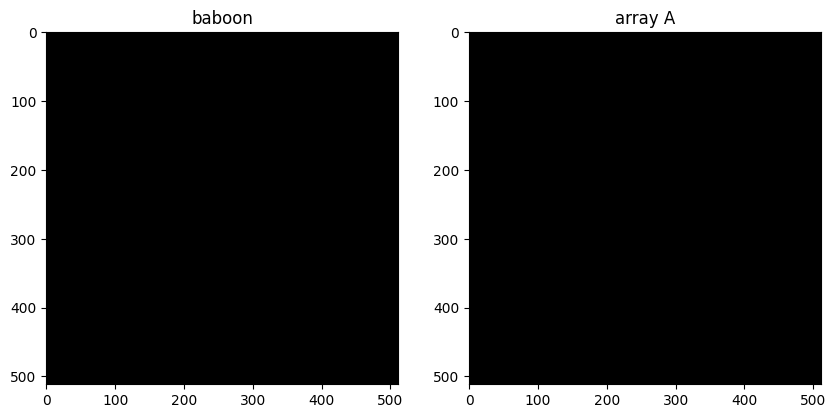

In [ ]:
plt.figure(figsize=(10,10))                           # Tạo một vùng vẽ lớn (figure) có kích thước 10x10 inch để chứa 2 biểu đồ con.

plt.subplot(121)                                      # Tạo một ô biểu đồ con thứ nhất (trái) trong layout 1 hàng, 2 cột.
plt.imshow(cv2.cvtColor(baboon, cv2.COLOR_BGR2RGB))   # Chuyển đổi màu sắc BGR sang RGB rồi hiển thị nội dung của mảng 'baboon' (lúc này đã thành màu đen).
plt.title("baboon")                                   # Đặt tiêu đề cho ô biểu đồ con thứ nhất là "baboon".

plt.subplot(122)                                      # Tạo một ô biểu đồ con thứ hai (phải) trong layout 1 hàng, 2 cột.
plt.imshow(cv2.cvtColor(A, cv2.COLOR_BGR2RGB))        # Chuyển đổi màu sắc BGR sang RGB rồi hiển thị nội dung của mảng 'A' (cũng là màu đen).
plt.title("array A")                                  # Đặt tiêu đề cho ô biểu đồ con thứ hai là "array A".

plt.show()                                            # Hiển thị toàn bộ cửa sổ chứa hai biểu đồ con song song ra màn hình.


We see they are the same, this is called aliasing. Aliasing happens whenever one variable's value is assigned to another variable because variables are just names that store references to values. We can also compare <code>baboon</code> and array <code>B</code>:


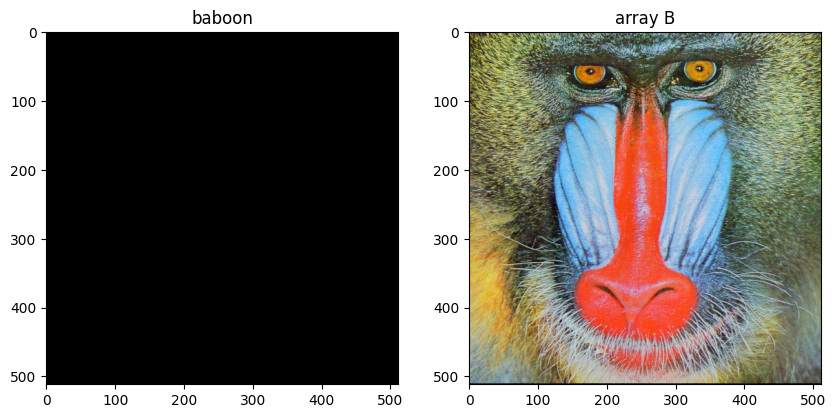

In [ ]:
plt.figure(figsize=(10,10))                           # Tạo một vùng vẽ lớn (figure) có kích thước 10x10 inch để chứa 2 biểu đồ con.

plt.subplot(121)                                      # Tạo một ô biểu đồ con thứ nhất (trái) trong layout 1 hàng, 2 cột.
plt.imshow(cv2.cvtColor(baboon, cv2.COLOR_BGR2RGB))   # Chuyển đổi màu sắc BGR sang RGB rồi hiển thị nội dung của mảng 'baboon' (lúc này đã thành màu đen).
plt.title("baboon")                                   # Đặt tiêu đề cho ô biểu đồ con thứ nhất là "baboon".

plt.subplot(122)                                      # Tạo một ô biểu đồ con thứ hai (phải) trong layout 1 hàng, 2 cột.
plt.imshow(cv2.cvtColor(B, cv2.COLOR_BGR2RGB))        # Chuyển đổi màu sắc BGR sang RGB rồi hiển thị nội dung của mảng 'B' (ảnh gốc).
plt.title("array B")                                  # Đặt tiêu đề cho ô biểu đồ con thứ hai là "array B".

plt.show()                                            # Hiển thị toàn bộ cửa sổ chứa hai biểu đồ con song song ra màn hình.



They are different because they used the method copy.


## Fliping Images 


Flipping images involves reordering the index of the pixels such that it changes the orientation of the image. Consider the following image:


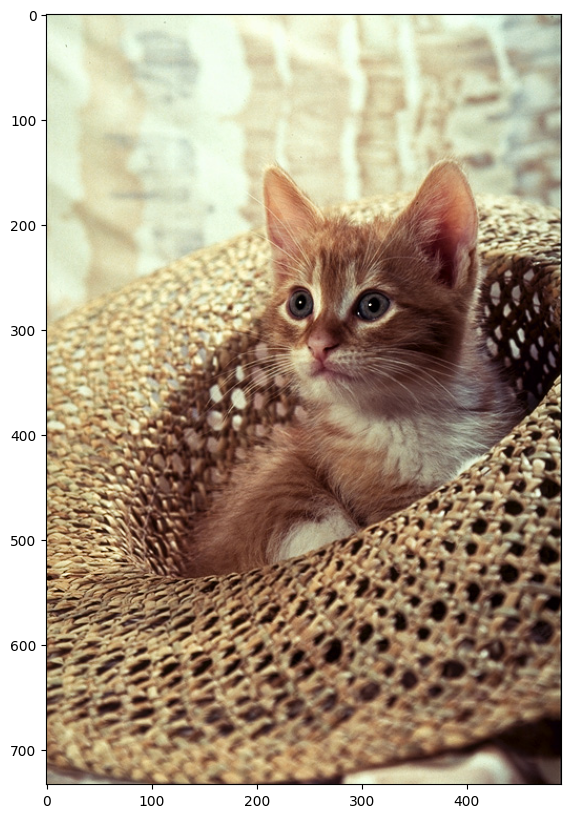

In [ ]:
image = cv2.imread("cat.png")                 # Đọc tệp hình ảnh 'cat.png' bằng thư viện OpenCV. OpenCV mặc định đọc ảnh dưới định dạng BGR.

plt.figure(figsize=(10,10))                       # Tạo một vùng vẽ (figure) trong Matplotlib có kích thước 10x10 inch.

plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)) # **Chuyển đổi màu sắc**: Chuyển đổi ảnh từ định dạng BGR (OpenCV) sang RGB (Matplotlib) trước khi hiển thị để đảm bảo màu sắc chính xác.

plt.show()                                        # Hiển thị cửa sổ chứa hình ảnh đã chuyển đổi màu ra màn hình.


We can cast it to an array and find the shape:


In [ ]:
width, height, C = image.shape               # Lấy các kích thước từ thuộc tính .shape của mảng 'image':
                                             # .shape trả về thứ tự (height, width, channels).
                                             # -> width sẽ chứa giá trị chiều cao (height).
                                             # -> height sẽ chứa giá trị chiều rộng (width).
                                             # -> C sẽ chứa số kênh màu (channels).

print('width, height,C', width, height, C)  # In ra màn hình dòng chữ 'width, height,C' cùng với các giá trị số tương ứng.


width, height,C 733 490 3


Let's Flip i.e rotate it vertically. First, we create an array of equal size of type <code>np.uint8</code> bit image.


In [ ]:
array_flip = np.zeros((width, height, C), dtype=np.uint8) 
# Tạo một mảng NumPy mới có tên 'array_flip' với các đặc điểm sau:
# 1. Kích thước giống hệt ảnh gốc: (chiều cao x chiều rộng x số kênh màu).
# 2. Điền đầy tất cả các giá trị bằng SỐ KHÔNG (màu đen).
# 3. Kiểu dữ liệu là 'np.uint8' (số nguyên không dấu 8-bit), đây là kiểu dữ liệu chuẩn để lưu trữ giá trị pixel (từ 0 đến 255).


We assign the first row of pixels of the original array to the new array's last row. We repeat the process for every row, incrementing the row number for the original array and decreasing the new array's row index assigning the pixels accordingly.


In [ ]:
for i,row in enumerate(image):
    # Bắt đầu một vòng lặp duyệt qua từng hàng trong mảng 'image' (ảnh gốc).
    # 'i' là chỉ mục (index) của hàng hiện tại, bắt đầu từ 0.
    # 'row' là dữ liệu của hàng ảnh hiện tại.

    array_flip[width - 1 - i, :, :] = row 
    # Gán hàng dữ liệu 'row' đó vào vị trí tương ứng trong mảng mới 'array_flip', 
    # NHƯNG với chỉ mục được đảo ngược:
    # 
    # 'width - 1 - i' tính toán vị trí hàng ngược lại (ví dụ: hàng 0 của ảnh gốc 
    # được gán vào hàng cuối cùng của ảnh lật; hàng 1 được gán vào hàng áp cuối, v.v.).
    # ':, :' đảm bảo toàn bộ dữ liệu chiều rộng và các kênh màu của hàng đó được sao chép.


We plot the results


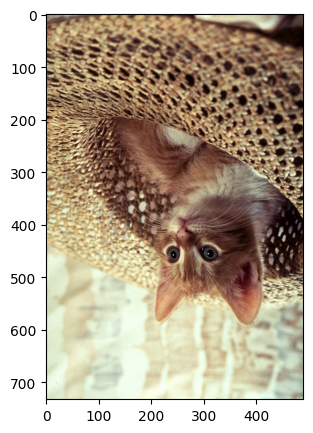

In [ ]:
plt.figure(figsize=(5,5))                               # Tạo một vùng vẽ (figure) trong Matplotlib có kích thước 5x5 inch.

plt.imshow(cv2.cvtColor(array_flip, cv2.COLOR_BGR2RGB)) # CHUYỂN ĐỔI: Chuyển đổi thứ tự kênh màu của ảnh từ BGR (cách OpenCV lưu) 
                                                        # sang RGB (cách Matplotlib hiển thị) trước khi vẽ. Hiển thị ảnh đã chuyển đổi.
plt.show()

<code>OpenCV</code>has several ways to flip an image, we can use  the <code>flip()</code> function; we have the input image array. The parameter is the <code>flipCode</code>

is the value indicating what kind of flip we would like to perform; 
<li><code>flipcode</code> = 0: flip vertically around the x-axis</li>
<li><code>flipcode</code> > 0: flip horizontally around y-axis positive value</li>
<li><code>flipcode</code>&#60 0: flip vertically and horizontally, flipping around both axes negative value</li>
Let apply different <code>flipcode</code>'s in a loop:


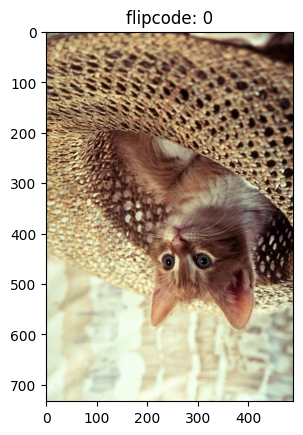

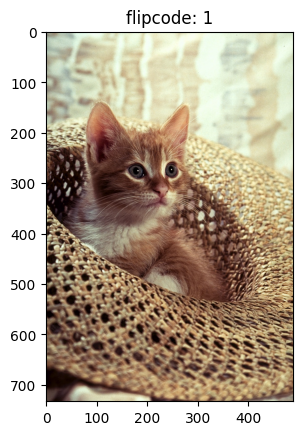

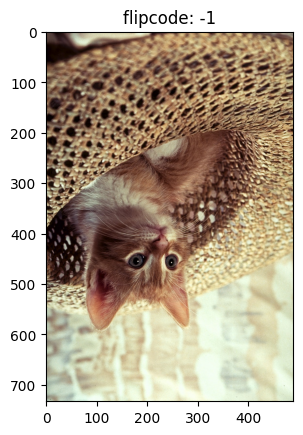

In [ ]:
for flipcode in [0, 1, -1]:
    # Bắt đầu một vòng lặp duyệt qua danh sách các mã lật: 0, 1, và -1.
    # Trong mỗi lần lặp, biến 'flipcode' sẽ nhận một trong các giá trị này.

    im_flip = cv2.flip(image, flipcode)
    # Áp dụng hàm lật ảnh của OpenCV lên ảnh gốc 'image'. 
    # 'flipcode' xác định hướng lật:
    # 0: Lật ảnh theo chiều dọc (trên xuống dưới).
    # 1: Lật ảnh theo chiều ngang (trái sang phải).
    # -1: Lật ảnh theo cả hai chiều (ngang và dọc, tương đương xoay 180 độ).

    plt.imshow(cv2.cvtColor(im_flip, cv2.COLOR_BGR2RGB))
    # Chuyển đổi màu sắc của ảnh đã lật từ BGR sang RGB và hiển thị lên vùng vẽ Matplotlib.

    plt.title("flipcode: " + str(flipcode))
    # Đặt tiêu đề cho biểu đồ, hiển thị giá trị 'flipcode' hiện tại (ví dụ: "flipcode: 0").

    plt.show()


We can also use the <code>rotate()</code> function. The parameter is an integer indicating what kind of flip we would like to perform. 


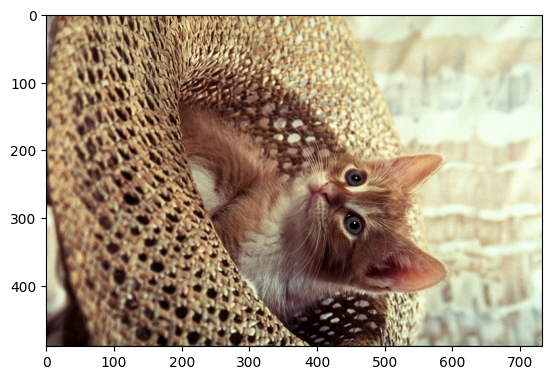

In [ ]:
im_flip = cv2.rotate(image, 0)                 # Xoay đối tượng hình ảnh 'image' bằng hàm cv2.rotate(). 
                                               # Đối số '0' là hằng số (tương đương với cv2.ROTATE_90_CLOCKWISE), 
                                               # nghĩa là xoay ảnh 90 độ theo chiều kim đồng hồ. Kết quả được lưu vào 'im_flip'.

plt.imshow(cv2.cvtColor(im_flip, cv2.COLOR_BGR2RGB)) # Chuyển đổi màu sắc của ảnh đã xoay từ BGR (OpenCV) sang RGB (Matplotlib) 
                                               # để hiển thị đúng màu, sau đó hiển thị nó lên vùng vẽ.

plt.show()                                     # Hiển thị cửa sổ hình ảnh đã xoay ra màn hình.


OpenCV module has built-in attributes the describe the type of flip, the values are just integers. Several are shown in the following <code>dict</code>:


In [ ]:
flip = {
    "ROTATE_90_CLOCKWISE": cv2.ROTATE_90_CLOCKWISE, # Hằng số đại diện cho phép xoay ảnh 90 độ theo chiều kim đồng hồ.
    "ROTATE_90_COUNTERCLOCKWISE": cv2.ROTATE_90_COUNTERCLOCKWISE, # Hằng số đại diện cho phép xoay ảnh 90 độ ngược chiều kim đồng hồ.
    "ROTATE_180": cv2.ROTATE_180                                  # Hằng số đại diện cho phép xoay ảnh 180 độ.
}


We see the keys are just an integer


In [ ]:
# Cách sử dụng giá trị này:
image_rotated = cv2.rotate(image, flip["ROTATE_90_CLOCKWISE"]) 
# Tương đương với:
# image_rotated = cv2.rotate(image, cv2.ROTATE_90_CLOCKWISE)


0

We can plot each of the outputs using the different  parameter values 


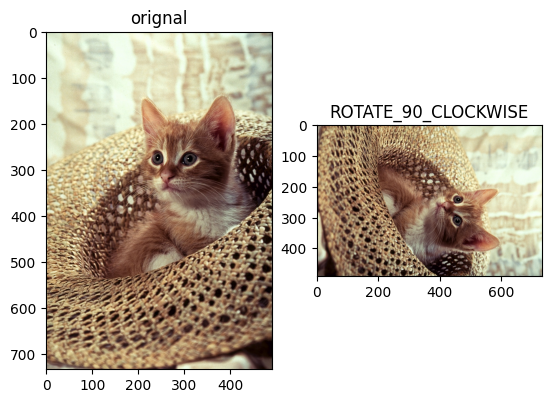

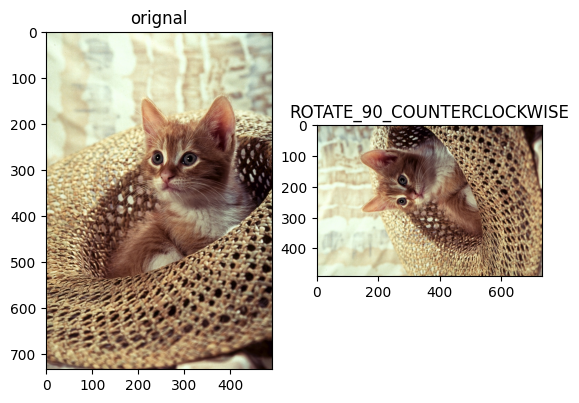

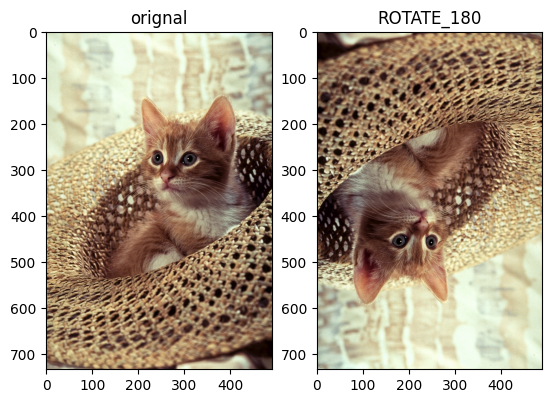

In [ ]:
for key, value in flip.items():
    # Bắt đầu vòng lặp duyệt qua từ điển 'flip'. Mỗi lần lặp lấy ra:
    # 'key': tên phép xoay (ví dụ: "ROTATE_90_CLOCKWISE")
    # 'value': hằng số OpenCV tương ứng (ví dụ: cv2.ROTATE_90_CLOCKWISE)

    plt.subplot(1,2,1)
    # Tạo ô biểu đồ con thứ nhất (trái) trong layout 1 hàng, 2 cột.

    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    # Chuyển đổi màu sắc và hiển thị ảnh gốc ('image') vào ô bên trái.

    plt.title("orignal")
    # Đặt tiêu đề cho ô bên trái là "original".

    plt.subplot(1,2,2)
    # Tạo ô biểu đồ con thứ hai (phải) trong layout 1 hàng, 2 cột.

    plt.imshow(cv2.cvtColor(cv2.rotate(image,value), cv2.COLOR_BGR2RGB))
    # Xoay ảnh gốc bằng 'value' (hằng số xoay hiện tại), chuyển đổi màu sắc, và hiển thị vào ô bên phải.

    plt.title(key)
    # Đặt tiêu đề cho ô bên phải chính là 'key' (tên phép xoay).

    plt.show()
    # Hiển thị cặp hình ảnh (gốc và đã xoay) ra màn hình trước khi chuyển sang lần lặp tiếp theo.


 ## Cropping an Image


Cropping is "cutting out" the part of the image and throwing out the rest; we can crop using arrays. Let start with a vertical crop; the variable <code>upper</code> is the first row that we would like to include in the image, the variable <code>lower</code> is the last row we would like to include. We then use slicing to obtain the new image. 


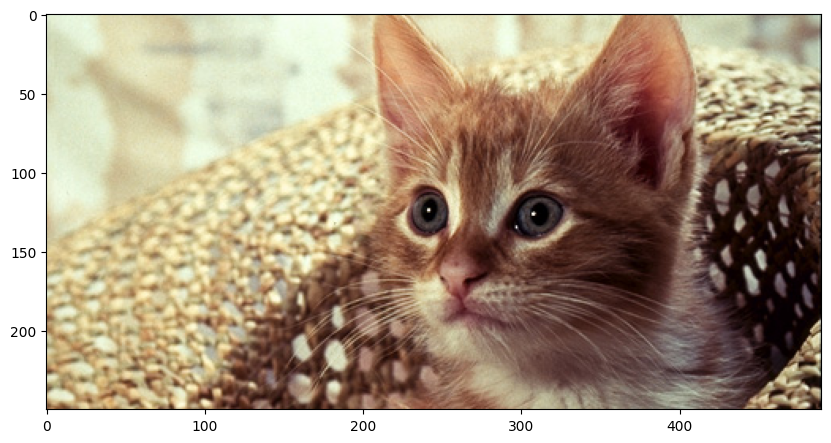

In [ ]:
upper = 150                                  # Định nghĩa chỉ số hàng bắt đầu cắt (mức trên, ví dụ: 150 pixel từ đỉnh ảnh xuống).
lower = 400                                  # Định nghĩa chỉ số hàng kết thúc cắt (mức dưới, ví dụ: 400 pixel từ đỉnh ảnh xuống).

crop_top = image[upper: lower,:,:]           # Cắt lát mảng 'image' (ảnh con mèo gốc):
                                             # [upper: lower, ...] chọn tất cả các hàng từ chỉ số 150 đến 399.
                                             # [:, :] giữ nguyên tất cả các cột (chiều rộng) và tất cả các kênh màu.
                                             # Kết quả là một mảng NumPy mới chứa dải pixel đã chọn, lưu vào 'crop_top'.

plt.figure(figsize=(10,10))                  # Tạo một vùng vẽ (figure) mới trong Matplotlib có kích thước 10x10 inch.

plt.imshow(cv2.cvtColor(crop_top, cv2.COLOR_BGR2RGB)) # Chuyển đổi màu sắc của phần ảnh đã cắt từ BGR sang RGB và hiển thị nó.

plt.show()                                   # Hiển thị cửa sổ chứa phần ảnh đã cắt ra màn hình.


consider the array <code>crop_top</code> we  can also crop horizontally  the variable right is the first column that we would like to include in the image, the variable left is the last column we would like to include in the image.


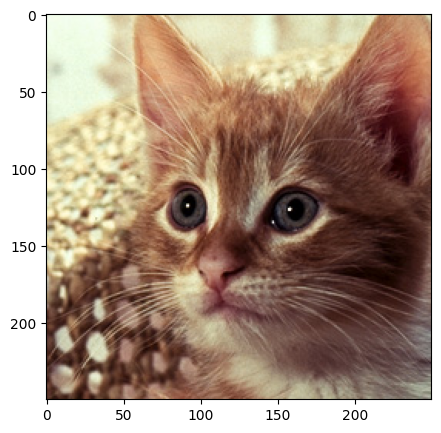

In [ ]:
left = 150                                   # Định nghĩa chỉ số cột bắt đầu cắt (mức bên trái, ví dụ: 150 pixel từ lề trái).
right = 400                                  # Định nghĩa chỉ số cột kết thúc cắt (mức bên phải, ví dụ: 400 pixel từ lề trái).

crop_horizontal = crop_top[: ,left:right,:]  # Cắt lát mảng 'crop_top' (phần ảnh đã cắt dọc trước đó):
                                             # [:, ...] giữ nguyên tất cả các hàng (chiều cao) của 'crop_top'.
                                             # [, left:right, :] chọn tất cả các cột từ chỉ số 150 đến 399.
                                             # [:, :, :] giữ nguyên tất cả các kênh màu.
                                             # Kết quả là một mảng NumPy mới chứa dải pixel đã chọn, lưu vào 'crop_horizontal'.

plt.figure(figsize=(5,5))                    # Tạo một vùng vẽ (figure) mới trong Matplotlib có kích thước 5x5 inch.

plt.imshow(cv2.cvtColor(crop_horizontal, cv2.COLOR_BGR2RGB)) # Chuyển đổi màu sắc của phần ảnh đã cắt hoàn chỉnh từ BGR sang RGB và hiển thị nó.

plt.show()                                   # Hiển thị cửa sổ chứa phần ảnh đã cắt ra màn hình.


## Changing Specific Image Pixels


We can change specific image pixels using  array indexing; for example, we can set  all the channels in the original image we cropped to zero :


In [ ]:
array_sq = np.copy(image)                          # Tạo một bản sao độc lập của mảng 'image' (ảnh gốc) và lưu vào 'array_sq'.
array_sq[upper:lower,left:right,:] = 0             # Gán giá trị 0 cho tất cả các pixel trong vùng ảnh được xác định bởi tọa độ upper, lower, left, right (biến vùng đó thành màu đen).


We can compare the results to the new image. 


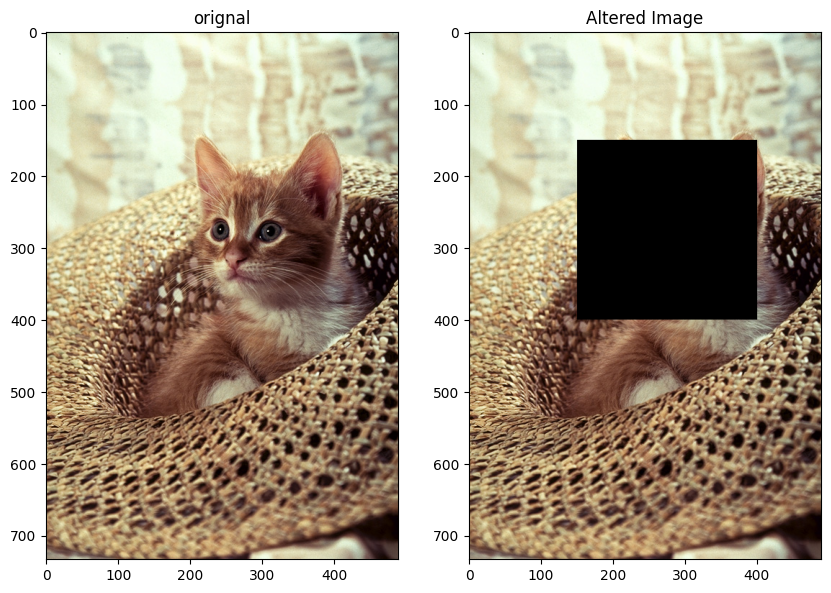

In [ ]:
plt.figure(figsize=(10,10))                           # Tạo một vùng vẽ lớn (figure) kích thước 10x10 inch để chứa hai biểu đồ con.

plt.subplot(1,2,1)                                    # Tạo ô biểu đồ con thứ nhất (trái) trong layout 1 hàng, 2 cột.
plt.imshow(cv2.cvtColor(image,cv2.COLOR_BGR2RGB))     # Chuyển đổi màu sắc BGR sang RGB rồi hiển thị ảnh gốc vào ô bên trái.
plt.title("original")                                 # Đặt tiêu đề cho ô bên trái là "original".

plt.subplot(1,2,2)                                    # Tạo ô biểu đồ con thứ hai (phải) trong layout 1 hàng, 2 cột.
plt.imshow(cv2.cvtColor(array_sq,cv2.COLOR_BGR2RGB))  # Chuyển đổi màu sắc BGR sang RGB rồi hiển thị ảnh đã chỉnh sửa ('array_sq', ảnh có vùng đen) vào ô bên phải.
plt.title("Altered Image")                            # Đặt tiêu đề cho ô bên phải là "Altered Image".

plt.show()                                            # Hiển thị cửa sổ chứa hai hình ảnh song song ra màn hình.


  We can also create shapes and <code>OpenCV</code>, we can use the method <code>rectangle</code>. The parameter  <code>pt1</code> is the top-left coordinate of the rectangle: <code>(left,top)</code> or $(x_0,y_0)$, <code>pt2</code> is the bottom right coordinate<code>(right,lower)</code> or $(x_1,y_1)$. The parameter <code>color</code>  is a tuple representing the intensity of each channel <code>( blue, green, red)</code>. Finally, we have the line thickness.


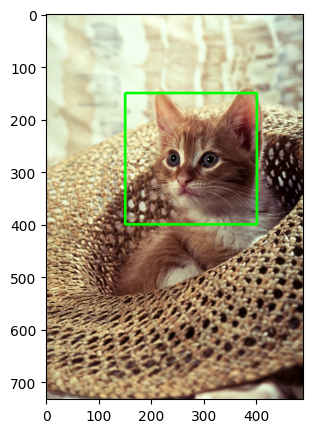

In [ ]:
start_point, end_point = (left, upper), (right, lower) 
# Định nghĩa hai tuple chứa tọa độ điểm bắt đầu (góc trên bên trái: x, y) và 
# điểm kết thúc (góc dưới bên phải: x, y) của hình chữ nhật.

image_draw = np.copy(image)                                
# Tạo một bản sao độc lập của mảng ảnh gốc ('image') để vẽ lên đó mà không làm hỏng ảnh gốc.

cv2.rectangle(image_draw, pt1=start_point, pt2=end_point, color=(0, 255, 0), thickness=3) 
# Sử dụng hàm vẽ hình chữ nhật của OpenCV (cv2.rectangle):
# - image_draw: Ảnh đích để vẽ lên.
# - pt1: Điểm bắt đầu (góc trên trái).
# - pt2: Điểm kết thúc (góc dưới phải).
# - color=(0, 255, 0): Định nghĩa màu sắc BGR là xanh lá cây rực rỡ.
# - thickness=3: Độ dày của đường viền hình chữ nhật là 3 pixel.

plt.figure(figsize=(5,5))                                  
# Tạo một vùng vẽ (figure) trong Matplotlib có kích thước 5x5 inch.

plt.imshow(cv2.cvtColor(image_draw, cv2.COLOR_BGR2RGB))    
# Chuyển đổi màu sắc ảnh đã vẽ từ BGR sang RGB và hiển thị nó.

plt.show()                                                 
# Hiển thị cửa sổ hình ảnh ra màn hình.


We can overlay text on an image using the function  <code>putText</code> with the following parameter values:



 <li><code>img</code>: Image array </li>
<li><code>text</code>: Text string to be overlayed</li>
<li><code>org</code>: Bottom-left corner of the text string in the image</li>
<li><code>fontFace</code>: tye type of font </li>
<li><code>fontScale</code>: Font scale</li>
<li><code>color</code>: Text color</li>
<li><code>thickness</code>: Thickness of the lines used to draw a text</li>
<li><code>lineType:</code> Line type</li>


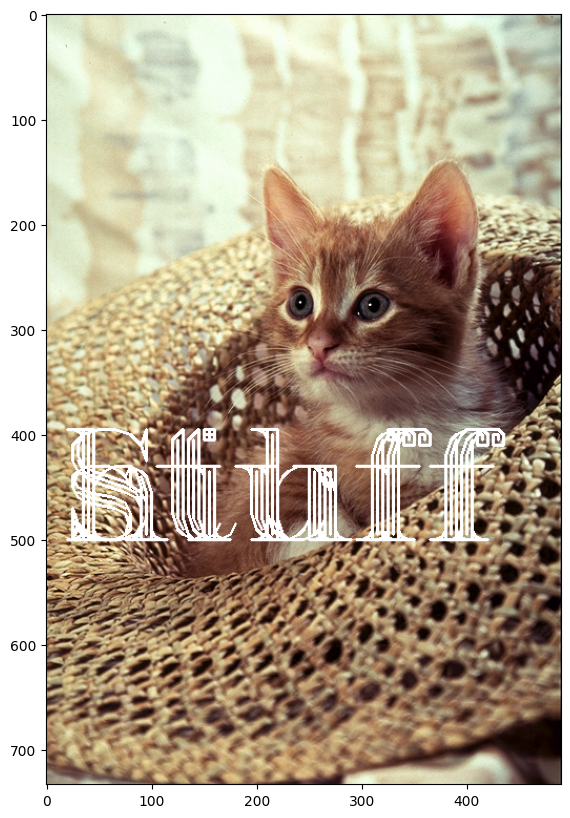

In [30]:
image_draw = cv2.putText(img=image, text='stuff', org=(10, 500), color=(255, 255, 255), fontFace=4, fontScale=5, thickness=2)
# Sử dụng hàm vẽ văn bản của OpenCV (cv2.putText) để vẽ dòng chữ 'Stuff' lên ảnh 'image' (lưu ý: thao tác này chỉnh sửa trực tiếp ảnh gốc image):
# - img=image: Ảnh đích để vẽ lên (ảnh con mèo gốc).
# - text='Stuff': Nội dung văn bản cần vẽ.
# - org=(10, 500): Tọa độ góc dưới bên trái (X, Y) nơi bắt đầu văn bản.
# - color=(255, 255, 255): Màu sắc BGR là trắng tinh.
# - fontFace=4: Kiểu font chữ (SIMPLEX).
# - fontScale=5: Kích thước tỷ lệ của font chữ (rất lớn).
# - thickness=2: Độ dày của nét chữ là 2 pixel.

plt.figure(figsize=(10,10))                                              
# Tạo một vùng vẽ (figure) trong Matplotlib có kích thước 10x10 inch.

plt.imshow(cv2.cvtColor(image_draw, cv2.COLOR_BGR2RGB))                  
# Chuyển đổi màu sắc ảnh đã vẽ từ BGR sang RGB và hiển thị nó.

plt.show()                                                               
# Hiển thị cửa sổ hình ảnh ra màn hình.


### Question-4: 
Use the image baboon.png from this lab or take any image you like.

Open the image and create a OpenCV Image object called `im`, convert the image from BGR format to RGB format, flip `im` vertically around the x-axis and create an image called `im_flip`, mirror `im` by flipping it horizontally around the y-axis and create an image called `im_mirror`, finally plot both images


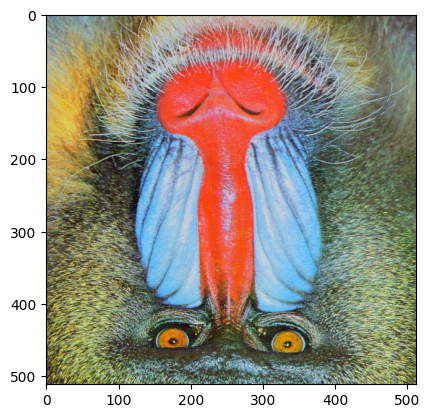

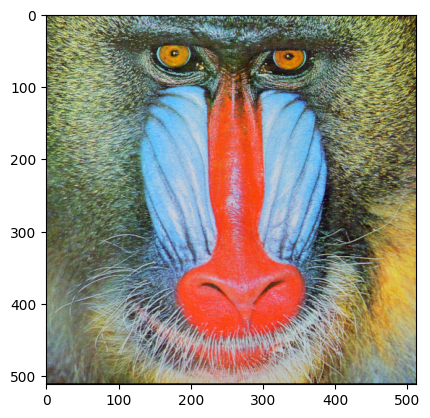

In [ ]:
im = cv2.imread("baboon.png")                 # Đọc tệp hình ảnh 'baboon.png' bằng OpenCV (lưu trữ dưới dạng BGR).

#  1: Lật ảnh theo chiều dọc

im_flip = cv2.flip(im, 0)                 # Lật ảnh 'im' theo chiều dọc (trên xuống dưới), sử dụng flipcode=0.
plt.imshow(cv2.cvtColor(im_flip, cv2.COLOR_BGR2RGB)) # Chuyển đổi màu sắc BGR sang RGB rồi hiển thị ảnh đã lật dọc.
plt.show()                                        # Hiển thị cửa sổ hình ảnh đầu tiên.

#  2: Lật ảnh theo chiều ngang (phản chiếu gương) 

im_mirror = cv2.flip(im, 1)                 # Lật ảnh 'im' theo chiều ngang (trái sang phải), sử dụng flipcode=1.
plt.imshow(cv2.cvtColor(im_mirror, cv2.COLOR_BGR2RGB)) # Chuyển đổi màu sắc BGR sang RGB rồi hiển thị ảnh đã lật ngang.
plt.show()                                        # Hiển thị cửa sổ hình ảnh thứ hai.


Double-click **here** for a hint.

<!-- The hint is below:

im_flip =  cv2.flip(baboon,0)
im_mirror =  cv2.flip(baboon, 1)

-->


Double-click **here** for the solution.

<!-- The answer is below:

im = cv2.imread("baboon.png")

im_flip =  cv2.flip(im, 0)
plt.imshow(cv2.cvtColor(im_flip, cv2.COLOR_BGR2RGB))
plt.show()

im_mirror =  cv2.flip(im, 1)
plt.imshow(cv2.cvtColor(im_mirror, cv2.COLOR_BGR2RGB))
plt.show()

-->


# References 


[1]  Images were taken from: https://homepages.cae.wisc.edu/~ece533/images/
    
[2]  <a href='https://pillow.readthedocs.io/en/stable/index.html'>Pillow Docs</a>

[3]  <a href='https://opencv.org/'>Open CV</a>

[4] Gonzalez, Rafael C., and Richard E. Woods. "Digital image processing." (2017).


<!--<h2>Change Log</h2>-->


<!--
<table>
    <tr>
        <th>Date (YYYY-MM-DD)</th>
        <th>Version</th>
        <th>Changed By</th>
        <th>Change Description</th>
    </tr>
    <tr>
        <td>2020-07-20</td>
        <td>0.2</td>
        <td>Azim</td>
        <td>Modified Multiple Areas</td>
    </tr>
    <tr>
        <td>2020-07-17</td>
        <td>0.1</td>
        <td>Azim</td>
        <td>Created Lab Template</td>
    </tr>
    <tr>
        <td>2021-03-06</td>
        <td>0.3</td>
        <td>Nayef</td>
        <td>Modified some codes</td>
    </tr>
</table>
-->


<h3 align="center"> &#169; IBM Corporation. All rights reserved. <h3/>
